In [84]:
#IMPORT RELEVANT LIBRARIES

import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import csv
import random
import math
import operator
import matplotlib.pyplot as plt  
import pandas as pd  
import os

import csv
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

import xgboost as xgb
from scipy.stats import uniform, randint
from sklearn.preprocessing import  MinMaxScaler, StandardScaler


In [72]:
#load the data and view the 1st 5 entries
df = pd.read_csv('skaters.csv')
df.head()

,AGE,ASSISTS,ATOI,BLK,CA,CF,CF_PERC,CF_PERC REL,DZS_PERC,E+/-,...,SH_ASSISTS,SH_GOALS,S_PERC,TEAM_NAME,THRU_PERC,TK,TM,TOI,TOI(EV),TOI/60
0,22,3,635,20.0,376,409,52.1,-2.2,33.7,NaN,...,0,0,3.8,NaN,56.0,7,DET,530,576,635
1,32,10,666,58.0,604,511,45.8,-9.2,57.6,NaN,...,0,0,0.0,NaN,56.3,22,PIT,910,491,657
2,30,37,1044,21.0,1107,1076,49.3,-0.7,50.8,NaN,...,0,0,13.3,NaN,56.4,65,ATL,1426,852,1043
3,28,9,923,88.0,885,933,51.3,-0.7,53.2,NaN,...,0,0,6.0,NaN,37.2,19,TOT,1169,790,913
4,37,51,1180,36.0,878,850,49.2,-3.9,44.8,NaN,...,3,1,11.9,NaN,52.9,76,OTT,1377,823,1163


In [3]:
#check the shape of the data
df.shape

(7947, 50)

In [4]:
#Show what columns possess missing data
df.isnull().sum()

AGE               0
ASSISTS           0
ATOI              0
BLK               7
CA                0
CF                0
CF_PERC           1
CF_PERC REL     143
DZS_PERC          7
E+/-           4390
EV_ASSISTS        0
EV_GOALS          0
FA                0
FF                0
FF_PERC           1
FF_PERC REL     143
FINALE_YEAR       0
FOL               7
FOW               7
FO_PERC        2933
GOALS             0
GP                0
GV                0
GW_GOALS          0
HIT               0
OISH_PERC        17
OISV_PERC        10
OZS_PERC          7
PDO              24
PIM               0
PLAYER_ID         0
PLAYER_NAME       0
PLUSMINUS         0
POS               0
PP_ASSISTS        0
PP_GOALS          0
PS                0
PTS               0
S                 0
SATT.             7
SH_ASSISTS        0
SH_GOALS          0
S_PERC          239
TEAM_NAME      7947
THRU_PERC       119
TK                0
TM                0
TOI               0
TOI(EV)           0
TOI/60            0


In [73]:
#Get all the columns of the dataset
df.columns

Index(['AGE', 'ASSISTS', 'ATOI', 'BLK', 'CA', 'CF', 'CF_PERC', 'CF_PERC REL',
       'DZS_PERC', 'E+/-', 'EV_ASSISTS', 'EV_GOALS', 'FA', 'FF', 'FF_PERC',
       'FF_PERC REL', 'FINALE_YEAR', 'FOL', 'FOW', 'FO_PERC', 'GOALS', 'GP',
       'GV', 'GW_GOALS', 'HIT', 'OISH_PERC', 'OISV_PERC', 'OZS_PERC', 'PDO',
       'PIM', 'PLAYER_ID', 'PLAYER_NAME', 'PLUSMINUS', 'POS', 'PP_ASSISTS',
       'PP_GOALS', 'PS', 'PTS', 'S', 'SATT.', 'SH_ASSISTS', 'SH_GOALS',
       'S_PERC', 'TEAM_NAME', 'THRU_PERC', 'TK', 'TM', 'TOI', 'TOI(EV)',
       'TOI/60'],
      dtype='object')

In [74]:
# Remove columns with 2000 (25%) missing records since filling the would include too much bias
# These columns are TEAM_NAME, FO_PERC, E+/-

# Remove columns that are essentially primary keys and add no value
#These columns are PLAYER_ID, PLAYER_NAME, TM
df = df[['AGE', 'ASSISTS', 'ATOI', 'BLK', 'CA', 'CF', 'CF_PERC', 'CF_PERC REL',
       'DZS_PERC', 'EV_ASSISTS', 'EV_GOALS', 'FA', 'FF', 'FF_PERC',
       'FF_PERC REL', 'FINALE_YEAR', 'FOL', 'FOW', 'GOALS', 'GP',
       'GV', 'GW_GOALS', 'HIT', 'OISH_PERC', 'OISV_PERC', 'OZS_PERC', 'PDO',
       'PIM','PLUSMINUS', 'POS', 'PP_ASSISTS',
       'PP_GOALS', 'PS', 'PTS', 'S', 'SATT.', 'SH_ASSISTS', 'SH_GOALS',
       'S_PERC', 'THRU_PERC', 'TK', 'TOI', 'TOI(EV)',
       'TOI/60']]

df.shape

(7947, 44)

In [75]:
#Fill in the remaining missing data with the mean and check for anymore missing data

df['BLK'] = df['BLK'].replace(np.NAN, df['BLK'].mean())
df['CF_PERC'] = df['CF_PERC'].replace(np.NAN, df['CF_PERC'].mean())
df['CF_PERC REL'] = df['CF_PERC REL'].replace(np.NAN, df['CF_PERC REL'].mean())
df['DZS_PERC'] = df['DZS_PERC'].replace(np.NAN, df['DZS_PERC'].mean())
df['FF_PERC REL'] = df['FF_PERC REL'].replace(np.NAN, df['FF_PERC REL'].mean())
df['FF_PERC'] = df['FF_PERC'].replace(np.NAN, df['FF_PERC'].mean())
df['FOL'] = df['FOL'].replace(np.NAN, df['FOL'].mean())
df['FOW'] = df['FOW'].replace(np.NAN, df['FOW'].mean())
df['OISH_PERC'] = df['OISH_PERC'].replace(np.NAN, df['OISH_PERC'].mean())
df['OISV_PERC'] = df['OISV_PERC'].replace(np.NAN, df['OISV_PERC'].mean())
df['OZS_PERC'] = df['OZS_PERC'].replace(np.NAN, df['OZS_PERC'].mean())
df['PDO'] = df['PDO'].replace(np.NAN, df['PDO'].mean())
df['SATT.'] = df['SATT.'].replace(np.NAN, df['SATT.'].mean())
df['S_PERC'] = df['S_PERC'].replace(np.NAN, df['S_PERC'].mean())
df['THRU_PERC'] = df['THRU_PERC'].replace(np.NAN, df['THRU_PERC'].mean())

df.isnull().sum()

AGE            0
ASSISTS        0
ATOI           0
BLK            0
CA             0
CF             0
CF_PERC        0
CF_PERC REL    0
DZS_PERC       0
EV_ASSISTS     0
EV_GOALS       0
FA             0
FF             0
FF_PERC        0
FF_PERC REL    0
FINALE_YEAR    0
FOL            0
FOW            0
GOALS          0
GP             0
GV             0
GW_GOALS       0
HIT            0
OISH_PERC      0
OISV_PERC      0
OZS_PERC       0
PDO            0
PIM            0
PLUSMINUS      0
POS            0
PP_ASSISTS     0
PP_GOALS       0
PS             0
PTS            0
S              0
SATT.          0
SH_ASSISTS     0
SH_GOALS       0
S_PERC         0
THRU_PERC      0
TK             0
TOI            0
TOI(EV)        0
TOI/60         0
dtype: int64

In [76]:
#Convert categorical variables to numerical ones using encoding

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

#define the categorical column of interest
data = df['POS']
values = np.array(data)
print(values)
# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(values)
print(integer_encoded)
# binary encode
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
print(onehot_encoded)
print(onehot_encoded.shape)

['LW' 'RW' 'RW' ... 'LW' 'LW' 'LW']
[2 3 3 ... 2 2 2]
[[0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 ...
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]]
(7947, 5)


C:\Users\User\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:371: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


In [77]:
#Remove the categorical column from the dataset
df = df.drop("POS", axis=1)

In [78]:
# Add the onehot encoding back to the original dataset
onehot_df = pd.DataFrame(onehot_encoded)
print(onehot_df.shape)
clean_df =  pd.concat([df, onehot_df], axis=1)

(7947, 5)


## Determine Dependent and Independent Variables, Split and Scale the Data

Since we are trying to predict the number of points which is the sum of goals and assists, points becomes the dependent variable.

To build an non biased model, we have to remove goals and assist columns from the independent variable since we are trying to predict the sum of goals and assists. It makes no sense to predict points when part of our predictor variables directly includes features derived from goals and assists.

All variables directly related to goals and assists are also removed from the independent variables. The variables are EV assists, EV goals, PP Assists, PP Goals, PS.

This implies that our model does not rely on features that are directly based on goals and assists. 

In [79]:
#Remove Goals and Assists related features from the data
clean_df = clean_df.drop(['ASSISTS', 'GOALS', 'EV_ASSISTS', 'EV_GOALS', 'PP_ASSISTS', 'PP_GOALS', 'PS'], axis=1)
clean_df.shape

(7947, 41)

In [80]:
#create the X and Y
df_y = clean_df['PTS']
df_x = clean_df.drop('PTS', axis=1)

#scale the data to prevent over dependence on some features
scaler = MinMaxScaler()
df_x = scaler.fit_transform(df_x)

C:\Users\User\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:334: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


In [104]:
#plot all variables against the others to see what the relationship looks like
sns.pairplot(pd.DataFrame(df_x))

Split the data into training and testing

In [81]:
#Fix random seed for reproducibility

np.random.seed(42)
random.seed(42)
np.random.RandomState(42)

In [82]:
#Split the data into training and testing.
#Here, I use 2010 to 2017 for training and test using 2018

train_x = np.array(df_x[0:7058, :])
test_x = np.array(df_x[7058:,:])
train_y = np.array(df_y[0:7058])
test_y = np.array(df_y[7058:])

## Create Machine Learning Model

In [83]:
#Initailize an XGBoost Model using sqaured error loss
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', nthread=-1)
xgb_model.fit(train_x, train_y.reshape(len(train_y),))
    
#Define a set of parameters from which the best one should be determined from.
params = {
"colsample_bytree": uniform(0.7, 0.3),
"gamma": uniform(0, 0.5),
"learning_rate": uniform(0.03, 0.3), # default 0.1 
"max_depth": randint(2, 6), # default 3
"n_estimators": randint(100, 150), # default 100
"subsample": uniform(0.6, 0.4)}

#create a randomized search cross validation of the parameter grid
search = RandomizedSearchCV(xgb_model,
                            param_distributions=params,
                            random_state=42,
                            n_iter=50,
                            cv=5,
                            verbose=1,
                            n_jobs=-1,
                            return_train_score=True)

#fit the search model
search.fit(train_x, train_y.reshape(len(train_y),))

#assign the best estimator as the final model
xgb_model = search.best_estimator_

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.3min finished


R2 score:  0.9828466588370213
MSE:  8.29687214228756


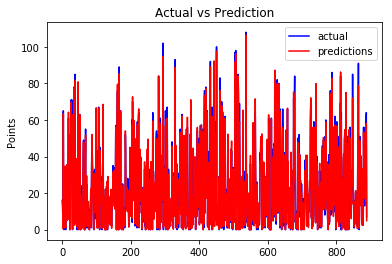

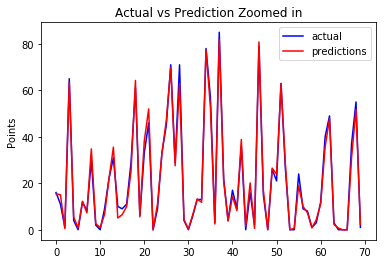

In [101]:
#make predictions using the model
predictions = xgb_model.predict(test_x)
actual = test_y.reshape(test_y.shape[0],)
    
#plot the actual point vs the predicted points
x = np.array(range(len(actual)))
plt.figure()
plt.plot(x,actual, color='b', label='actual')
plt.plot(x, predictions, color='r', label='predictions')
plt.ylabel('Points')
plt.title('Actual vs Prediction')
plt.legend()

#plot the zoomed in actual point vs the predicted points
x = np.array(range(len(actual)))
plt.figure()
plt.plot(x[:70],actual[:70], color='b', label='actual')
plt.plot(x[:70], predictions[:70], color='r', label='predictions')
plt.ylabel('Points')
plt.title('Actual vs Prediction Zoomed in')
plt.legend()

    
#calculate error metrics
#print('R2 score: ', xgb_model.score(test_x, test_y))
MSE = mean_squared_error(predictions, actual)
R2 = r2_score(actual, predictions)
print('R2 score: ', R2)
print('MSE: ', MSE)

In [89]:
#Get the parameters of the best model derived from cross validation
print(xgb_model)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=0.8345272428958741,
       gamma=0.49722873130541034, importance_type='gain',
       learning_rate=0.0827775758032036, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=132, n_jobs=1,
       nthread=-1, objective='reg:squarederror', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=0.7975574860733738, verbosity=1)


In [36]:
clean_df.drop('PTS', axis=1).head()

,AGE,ATOI,BLK,CA,CF,CF_PERC,CF_PERC REL,DZS_PERC,FA,FF,...,THRU_PERC,TK,TOI,TOI(EV),TOI/60,0,1,2,3,4
0,22,635,20.0,376,409,52.1,-2.2,33.7,280,303,...,56.0,7,530,576,635,0.0,0.0,1.0,0.0,0.0
1,32,666,58.0,604,511,45.8,-9.2,57.6,421,376,...,56.3,22,910,491,657,0.0,0.0,0.0,1.0,0.0
2,30,1044,21.0,1107,1076,49.3,-0.7,50.8,860,785,...,56.4,65,1426,852,1043,0.0,0.0,0.0,1.0,0.0
3,28,923,88.0,885,933,51.3,-0.7,53.2,665,680,...,37.2,19,1169,790,913,0.0,1.0,0.0,0.0,0.0
4,37,1180,36.0,878,850,49.2,-3.9,44.8,646,621,...,52.9,76,1377,823,1163,0.0,0.0,0.0,1.0,0.0


Retrain the model using the full dataset and the best parameters derived from the randomized cross validation

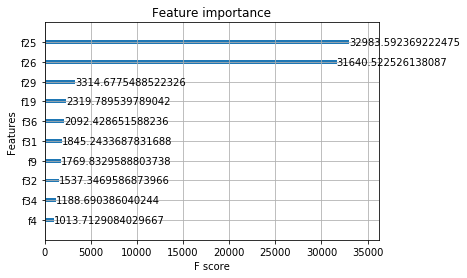

In [90]:
#Initailize an XGBoost Model using sqaured error loss and the parameters obtained from cross-validation
xgb_model = xgb.XGBRegressor(objective='reg:squarederror',
                             nthread=-1,
                            colsample_bytree = 0.8345272428958741,
                            gamma = 0.49722873130541034,
                            learning_rate = 0.0827775758032036,
                            max_depth = 5,
                            n_estimators = 132,
                            subsample = 0.7975574860733738)
xgb_model.fit(np.array(df_x), np.array(df_y).reshape(len(df_y),))
    
#plot feature importance using gain criteria for the top 10 important features
xgb.plot_importance(xgb_model, max_num_features=10, importance_type='gain')

In [106]:
#Determine the percentage of predicting power of the various features.
xgb_model.feature_importances_

array([0.0009635 , 0.00632366, 0.00286421, 0.00131622, 0.01171067,
       0.00144768, 0.00433101, 0.00439402, 0.00185646, 0.02044556,
       0.0014002 , 0.00179406, 0.00150239, 0.00770718, 0.00469065,
       0.00196667, 0.00539444, 0.00450255, 0.0056933 , 0.02679879,
       0.00146149, 0.00250279, 0.00134923, 0.001493  , 0.00131021,
       0.3810348 , 0.3655193 , 0.00133746, 0.00163932, 0.03829199,
       0.00154974, 0.02131672, 0.01775982, 0.00298454, 0.01373205,
       0.00166307, 0.02417226, 0.00174056, 0.00203843, 0.        ],
      dtype=float32)

In [109]:
#Get the names of the features 25 and 26, the top 2 features
first = clean_df.drop('PTS', axis=1).columns[25]
second  = clean_df.drop('PTS', axis=1).columns[26]

In [110]:
#Get the names of the next three best features

third = clean_df.drop('PTS', axis=1).columns[29]
fourth = clean_df.drop('PTS', axis=1).columns[19]
fifth = clean_df.drop('PTS', axis=1).columns[36]

print('First: ', first)
print('Second: ', second)
print('Thrid: ', third)
print('Fourth: ', fourth)
print('Fifth: ', fifth)

First:  S
Second:  SATT.
Thrid:  S_PERC
Fourth:  OISH_PERC
Fifth:  1


From the plot of the feature importance using gain as the importance type, it shows clearly that features 25 and 26 are the most important ones. These features are the shots on goal and total shots attempted respectively. This makes sense especially for shots on goal because the more shots a player takes on target, the more likely they are to score.

Shots on Goal represents 38.1% of the importance. This is closely followed by Total Shots with 36.55%. These two together account for almost 75% of the predicting power. With these two features alone, one can quite fairly predict how many points a player would have in the future.

The other important features are Shooting Percentage, On Ice Shooting Percentage and 1. Remember here that 1 is an engineered feature gotten from the one-hot encoding of Position feature. Zero here represents the position 'RW'. This implies that a player who plays that position is more likely to score goals compared to other positions.

## Testing on 2019 data

In [44]:
#load the 2019 data and view the 1st 5 entries

#please input the exact name of the 2019 data set in place of skaters.csv
df_test = pd.read_csv('skaters.csv')

In [45]:
# Remove columns with 2000 (25%) missing records since filling the would include too much bias
# These columns are TEAM_NAME, FO_PERC, E+/-

# Remove columns that are essentially primary keys and add no value
#These columns are PLAYER_ID, PLAYER_NAME, TM
df_new = df_test[['AGE', 'ASSISTS', 'ATOI', 'BLK', 'CA', 'CF', 'CF_PERC', 'CF_PERC REL',
       'DZS_PERC', 'EV_ASSISTS', 'EV_GOALS', 'FA', 'FF', 'FF_PERC',
       'FF_PERC REL', 'FINALE_YEAR', 'FOL', 'FOW', 'GOALS', 'GP',
       'GV', 'GW_GOALS', 'HIT', 'OISH_PERC', 'OISV_PERC', 'OZS_PERC', 'PDO',
       'PIM','PLUSMINUS', 'PP_ASSISTS',
       'PP_GOALS', 'PS', 'PTS', 'S', 'SATT.', 'SH_ASSISTS', 'SH_GOALS',
       'S_PERC', 'THRU_PERC', 'TK', 'TOI', 'TOI(EV)',
       'TOI/60']]

In [46]:
#Fill in missing values in the test set if any

for col in df_new.columns:
    df[col] = df[col].replace(np.NAN, df[col].mean())
    

In [47]:
#define the categorical column of interest
data = df_test['POS']
values = np.array(data)

# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(values)

# binary encode
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded = onehot_encoder.fit_transform(integer_encoded)

print(onehot_encoded)
print(onehot_encoded.shape)

#Remove the categorical column from the dataset
#df_new = df_new.drop("POS", axis=1)

# Add the onehot encoding back to the original dataset
onehot_df = pd.DataFrame(onehot_encoded)
print(onehot_df.shape)
clean_df_test =  pd.concat([df_new, onehot_df], axis=1)

[[0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 ...
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]]
(7947, 5)
(7947, 5)


C:\Users\User\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:371: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


In [48]:
#Remove Goals and Assists related features from the data
clean_df_test = clean_df_test.drop(['ASSISTS', 'GOALS', 'EV_ASSISTS', 'EV_GOALS', 'PP_ASSISTS', 'PP_GOALS', 'PS'], axis=1)

In [49]:
#create the X and Y
df_y_test = np.array(clean_df_test['PTS'])
df_x_test = clean_df_test.drop('PTS', axis=1)

#scale the data to prevent over dependence on some features
scaler = MinMaxScaler()
df_x_test = scaler.fit_transform(df_x_test)

C:\Users\User\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:334: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


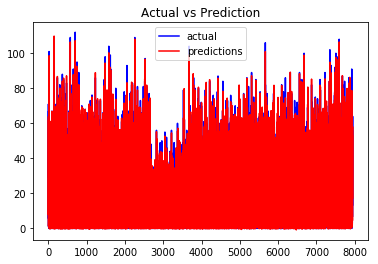

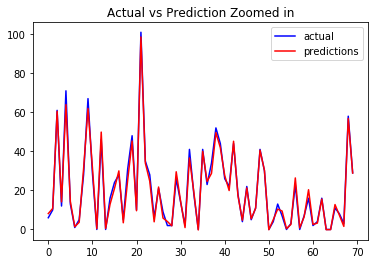

In [50]:
#make predictions using the model
predictions = xgb_model.predict(np.array(df_x_test))
actual = df_y_test.reshape(df_y_test.shape[0],)
    
#plot the actual point vs the predicted points
x = np.array(range(len(actual)))
plt.figure()
plt.plot(x,actual, color='b', label='actual')
plt.plot(x, predictions, color='r', label='predictions')
plt.title('Actual vs Prediction')
plt.legend()

#plot the zoomed in actual point vs the predicted points
x = np.array(range(len(actual)))
plt.figure()
plt.plot(x[:70],actual[:70], color='b', label='actual')
plt.plot(x[:70], predictions[:70], color='r', label='predictions')
plt.title('Actual vs Prediction Zoomed in')
plt.legend()


In [59]:
#save file to csv

Predicted_Score = pd.DataFrame(predictions)
Results = pd.concat([df_test[['PLAYER_ID', 'PLAYER_NAME']], Predicted_Score], axis=1)

Results.to_csv('Results.csv', index=None, header=['Player_ID,', 'Player_Name', 'Predicted_Score'])
